In [1]:
# ignore warnings for better clarity (may not be the best thing to do)...
import warnings
warnings.filterwarnings('ignore')

In [2]:
import tensorflow as tf
import keras
from keras.preprocessing import sequence 
from keras.models import Sequential 
from keras.layers import Dense, Embedding 
from keras.layers import LSTM 
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt

In [3]:
print("tensorflow version %s (should be at least 0.12.1)" % tf.__version__)
print("keras version %s (should be at least 2.0.7)" % keras.__version__)

tensorflow version 2.3.1 (should be at least 0.12.1)
keras version 2.4.3 (should be at least 2.0.7)


## <font color=darkred> Data exploration </font>

In [4]:
# load dataset
raw_data = pd.read_csv('./pollution.csv', header=0, index_col=0)
values = raw_data.values

This dataset provides hourly weather conditions and pollution levels for  five years at the US embassy in Beijing, China.

The complete feature list in the raw data is as follows:

``No``: row number

``year``: year of data in this row

``month``: month of data in this row

``day``: day of data in this row

``hour``: hour of data in this row

``pm2.5``: PM2.5 concentration i.e. pollution level

``DEWP``: Dew Point

``TEMP``: Temperature

``PRES``: Pressure

``cbwd``: Combined wind direction

``Iws``: Cumulated wind speed

``Is``: Cumulated hours of snow

``Ir``: Cumulated hours of rain

In [5]:
raw_data.head()

,pollution,dew,temp,press,wnd_dir,wnd_spd,snow,rain
date,,,,,,,,
2010-01-02 00:00:00,129.0,-16,-4.0,1020.0,SE,1.79,0,0
2010-01-02 01:00:00,148.0,-15,-4.0,1020.0,SE,2.68,0,0
2010-01-02 02:00:00,159.0,-11,-5.0,1021.0,SE,3.57,0,0
2010-01-02 03:00:00,181.0,-7,-5.0,1022.0,SE,5.36,1,0
2010-01-02 04:00:00,138.0,-7,-5.0,1022.0,SE,6.25,2,0


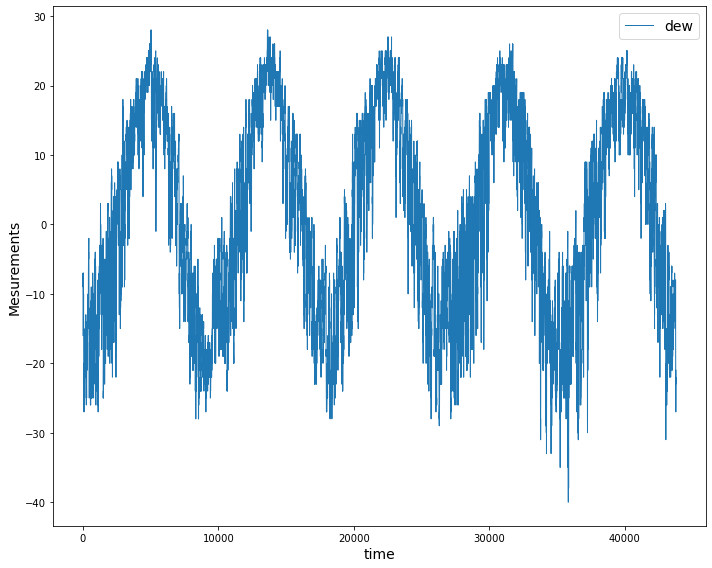

In [6]:
plt.figure(figsize=(10, 8))
plt.plot(values[:, 1], lw=1, label=raw_data.columns[1])
plt.legend(fontsize=14)
plt.xlabel('time', fontsize=14)
plt.ylabel('Mesurements', fontsize=14)
plt.tight_layout()

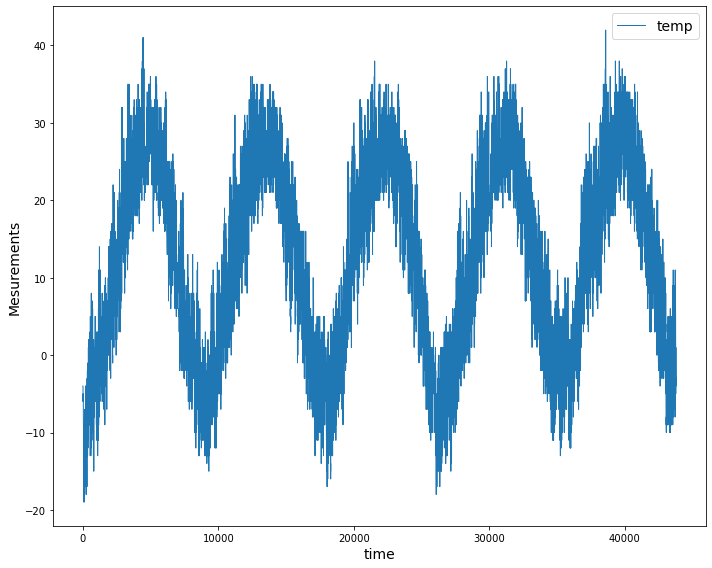

In [7]:
plt.figure(figsize=(10, 8))
plt.plot(values[:, 2], lw=1, label=raw_data.columns[2])
plt.legend(fontsize=14)
plt.xlabel('time', fontsize=14)
plt.ylabel('Mesurements', fontsize=14)
plt.tight_layout()

**Questions**

Display the pollution level as a function of time.

Use the ``heatmap`` function to display the correlation of the data.

Display boxplots of the pollution values as a function of other variables values
(This may help to detect useless features for prediction).


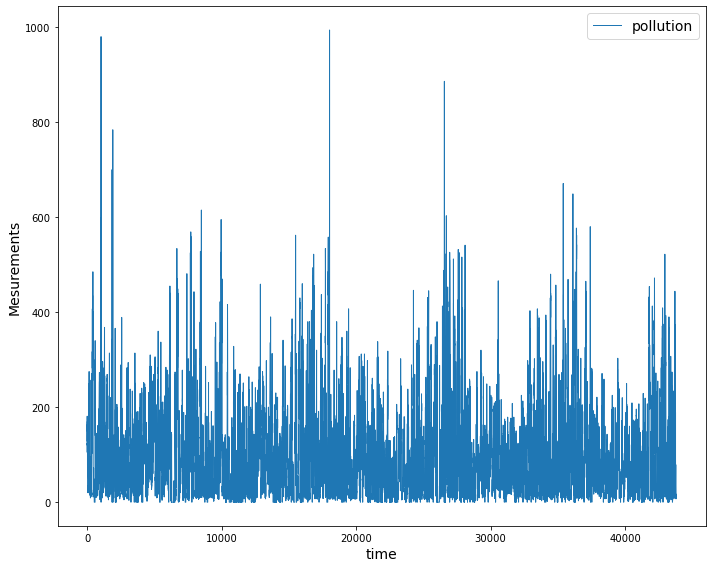

In [8]:

# plot the pollution level
plt.figure(figsize=(10, 8))
plt.plot(values[:, 0], lw=1, label=raw_data.columns[0])
plt.legend(fontsize=14)
plt.xlabel('time', fontsize=14)
plt.ylabel('Mesurements', fontsize=14)
plt.tight_layout()


,pollution,dew,temp,press,wnd_spd,snow,rain
pollution,1.000000,0.157585,-0.090798,-0.045544,-0.234362,0.022226,-0.049045
dew,0.157585,1.000000,0.824432,-0.778737,-0.296720,-0.034484,0.125053
temp,-0.090798,0.824432,1.000000,-0.827205,-0.154902,-0.092726,0.049037
press,-0.045544,-0.778737,-0.827205,1.000000,0.185380,0.069031,-0.079840
wnd_spd,-0.234362,-0.296720,-0.154902,0.185380,1.000000,0.021876,-0.010137
snow,0.022226,-0.034484,-0.092726,0.069031,0.021876,1.000000,-0.009553
rain,-0.049045,0.125053,0.049037,-0.079840,-0.010137,-0.009553,1.000000


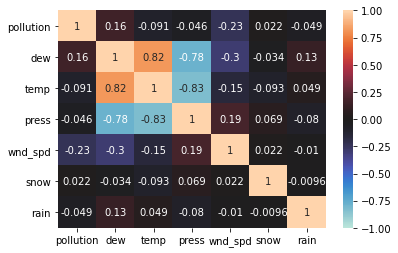

In [9]:
import seaborn as sns
corr = raw_data.corr()
sns.heatmap(corr, annot=True, vmin=-1, vmax=1, center=0)
corr.head(7)

Tout d'abord, nous pouvons remarquer que les paramètres testés ont très peu de corrélation avec la pollution (maximum de corrélation avec le point de rosée).

A travers cette heatmap, nous apprenons que la valeur maximal de corrélation est obtenue entre le point de rosée et la température. En ce qui concerne l'anti-corrélation, c'est entre le point de rosée et la pression.

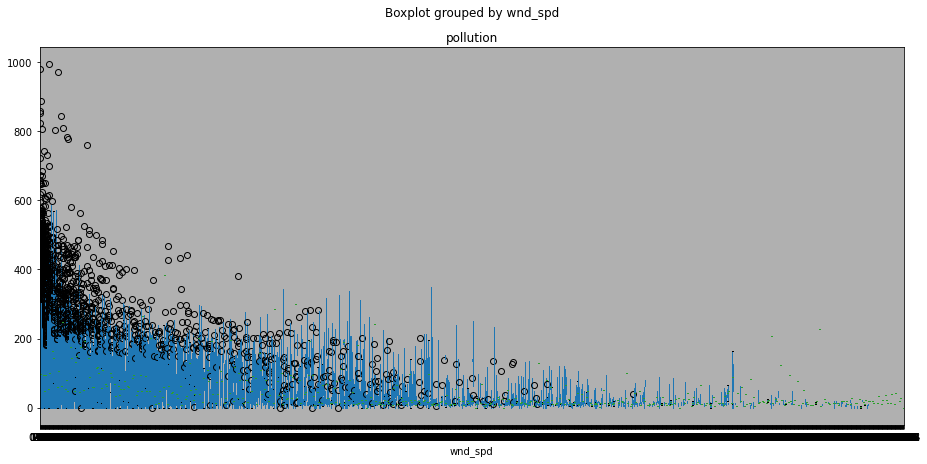

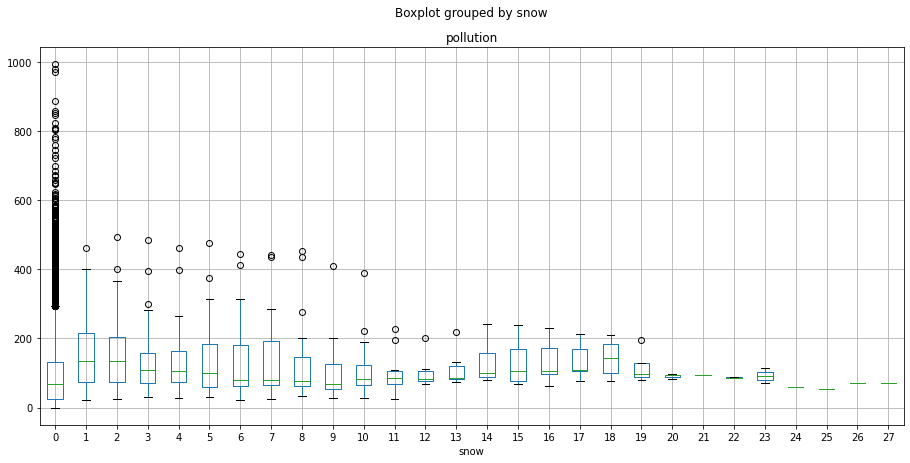

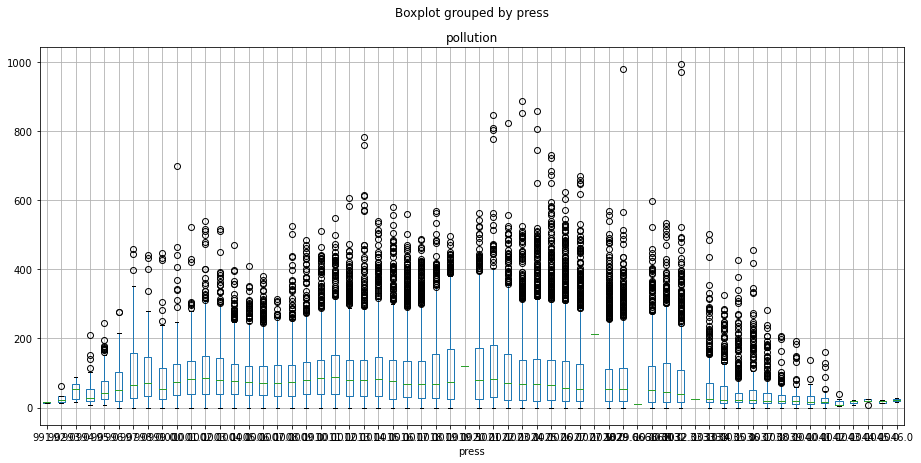

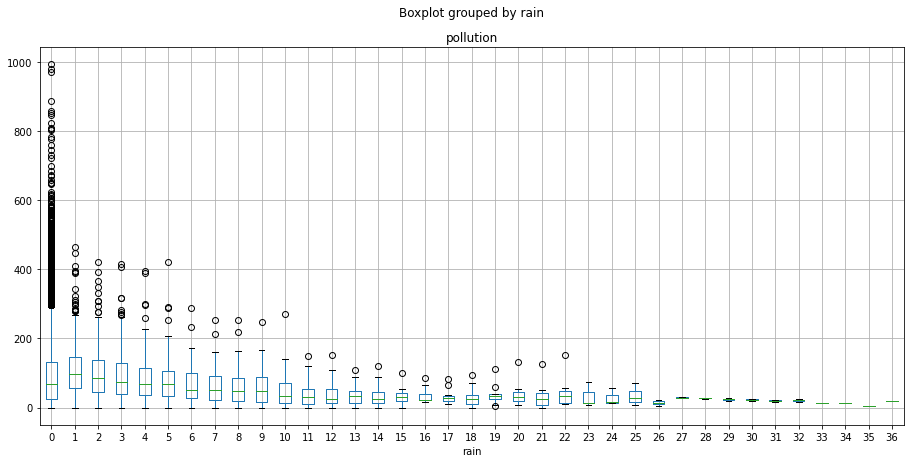

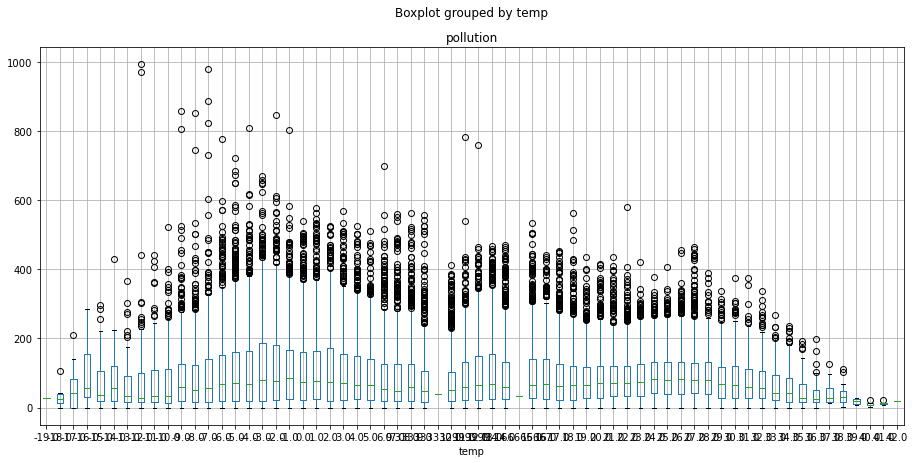

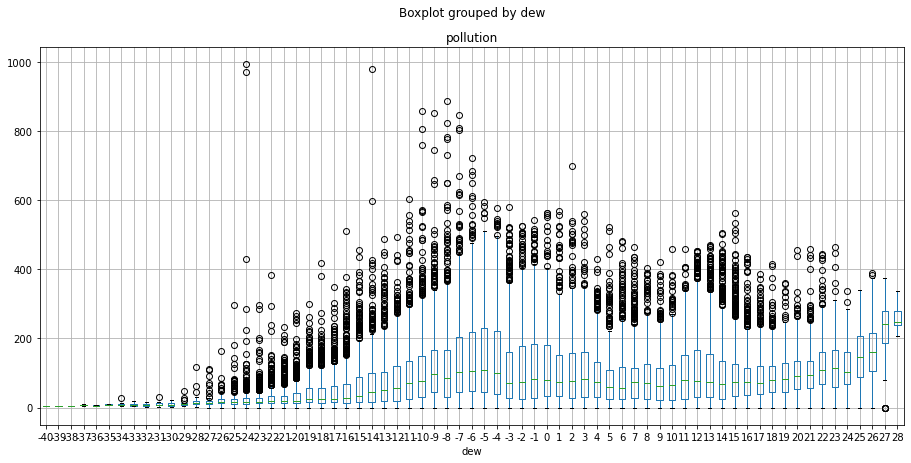

In [10]:
# some boxplots displaying the distribution of a feature within each category.
# This may help to detect useless features for classification... or a feature highly impacted by the category.
raw_data.boxplot('pollution', by='wnd_spd', figsize=(15,7))
raw_data.boxplot('pollution', by='snow', figsize=(15,7))
raw_data.boxplot('pollution', by='press', figsize=(15,7))
raw_data.boxplot('pollution', by='rain', figsize=(15,7))
raw_data.boxplot('pollution', by='temp', figsize=(15,7))
raw_data.boxplot('pollution', by='dew', figsize=(15,7))

Au niveau du graphique à moustache, une petite "boîte" permet une bonne prédiction, valeur proche de la moyenne.

Le graphique avec la vitesse du vent est difficile à analyser.

Si l'on analyse ces diagrammes, on se rend compte que pour des valeurs faibles au niveau du point de rosée, la pollution est faible et augmente avec l'augmentation des valeurs du point de rosée. Au niveau de la pluie, lorsque le niveau de précipitation est fort le niveau de la pollution est faible. Cependant, certains paramètres ne semblent pas avoir une grande influence sur la pollution (la température et la pression par exemple).

Finalement on se rend compte que les paramètres permettant d'améliorer la prédiction du niveau de pollutions sont la pluie et la neige, malgré un niveau de corrélation bas (il ne faut pas oublier la corrélation de la pollution avec le vitesse du vent également).

## <font color=darkred> Pre-processing </font>

Pre-processing from https://machinelearningmastery.com/multivariate-time-series-forecasting-lstms-keras/

Design which data to use as inputs and which as outputs.

This function gets rid of NaN values.

It may be skipped during the first read. The only crucial feature is the ``n_in`` parameters which states the number of previous time steps to consider in the input data.

The objective of this project is to predict the pollution level $y_t$ at time $t$ from previous observations.
Simple recurrent neural networks and Long Short-Term memory will be considered. At each time step the estimate $\hat{y}_t$ is obtained using a hidden state $h_{t-1}$ computed on the fly and input data $x_t$ at time $t$. 

The function ``build_dataset`` provives the values of $y_t$ in the last column and the values of the input $x_t$ in all the other columns.

If $n_{in} = 0$, $x_t$ is made of all measurements at time $t$ except the pollution level.


If $n_{in} = 1$, $x_t$ is made of all measurements at time $t$ except the pollution level and of all measurements at time  $t-1$.

If $n_{in} = 2$, $x_t$ is made of all measurements at time $t$ except the pollution level and of all measurements at time  $t-1$ and time $t-2$.

In [11]:
def build_dataset(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [12]:
#Load dataset
values = raw_data.values

# integer encode direction
encoder = preprocessing.LabelEncoder()
values[:,4] = encoder.fit_transform(values[:,4])
# ensure all data is float
values = values.astype('float32')
# normalize features
scaler = preprocessing.MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)

# parameter to design how many time steps to consider in the input data
time_lag = 0
n_features = 8
processed_data = build_dataset(scaled, time_lag, 1)
processed_data.head()

,var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t)
0,0.129779,0.352941,0.245902,0.527273,0.666667,0.002290,0.000000,0.0
1,0.148893,0.367647,0.245902,0.527273,0.666667,0.003811,0.000000,0.0
2,0.159960,0.426471,0.229508,0.545454,0.666667,0.005332,0.000000,0.0
3,0.182093,0.485294,0.229508,0.563637,0.666667,0.008391,0.037037,0.0
4,0.138833,0.485294,0.229508,0.563637,0.666667,0.009912,0.074074,0.0


In [13]:
# split into train and test sets
values = processed_data.values

# number of years to use for training
nb_years = 4
n_train_hours = nb_years*365 * 24

train = values[:n_train_hours, :]
test = values[n_train_hours:, :]

# split into input and outputs: 
# train_X contains the values of x_t i.e. all columns of the dataset except the last one
# train_y contains the associated values of y_t i.e. the last column of the dataset
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

In [14]:
print('x_train shape:', train_X.shape)
print('x_test shape:', test_X.shape)
print('y_train shape:', train_y.shape)
print('y_test shape:', test_y.shape)

x_train shape: (35040, 1, 7)
x_test shape: (8760, 1, 7)
y_train shape: (35040,)
y_test shape: (8760,)


In [15]:
print(train_X.shape[0], 'train samples')
print(test_X.shape[0], 'test samples')

35040 train samples
8760 test samples


In [16]:
input_shape = (train_X.shape[1], train_X.shape[2])
input_shape

(1, 7)

## <font color=darkred> Feed Forward Neural Network </font>

In [17]:
from random import randint
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import activations
import numpy as np
import matplotlib.pyplot as plt

**Question**

Define a FFNN model with one hidden layer

In [18]:
model_ffnn = Sequential()

model_ffnn.add(Flatten(input_shape=input_shape))
model_ffnn.add(Dense(32, activation='relu'))
model_ffnn.add(Dense(1, activation='linear'))



model_ffnn.compile(
    loss='mae',
    optimizer=keras.optimizers.Adagrad(),
    metrics=['mean_squared_error']
)

model_ffnn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 7)                 0         
_________________________________________________________________
dense (Dense)                (None, 32)                256       
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 289
Trainable params: 289
Non-trainable params: 0
_________________________________________________________________


In [19]:
batch_size = 64
epochs = 40
history = model_ffnn.fit(train_X, train_y,
                         batch_size=batch_size,
                         epochs=epochs,
                         verbose=1,
                         validation_data=(test_X, test_y))

Epoch 1/40
548/548 [==============================] - 1s 1ms/step - loss: 0.0195 - mean_squared_error: 0.0023 - val_loss: 0.0124 - val_mean_squared_error: 0.0011
Epoch 2/40
548/548 [==============================] - 0s 566us/step - loss: 0.0124 - mean_squared_error: 0.0019 - val_loss: 0.0091 - val_mean_squared_error: 9.8254e-04
Epoch 3/40
548/548 [==============================] - 0s 522us/step - loss: 0.0104 - mean_squared_error: 0.0018 - val_loss: 0.0078 - val_mean_squared_error: 9.4666e-04
Epoch 4/40
548/548 [==============================] - 0s 597us/step - loss: 0.0095 - mean_squared_error: 0.0018 - val_loss: 0.0071 - val_mean_squared_error: 9.3273e-04
Epoch 5/40
548/548 [==============================] - 0s 522us/step - loss: 0.0090 - mean_squared_error: 0.0018 - val_loss: 0.0069 - val_mean_squared_error: 9.2338e-04
Epoch 6/40
548/548 [==============================] - 0s 582us/step - loss: 0.0087 - mean_squared_error: 0.0018 - val_loss: 0.0065 - val_mean_squared_error: 9.2159e-0

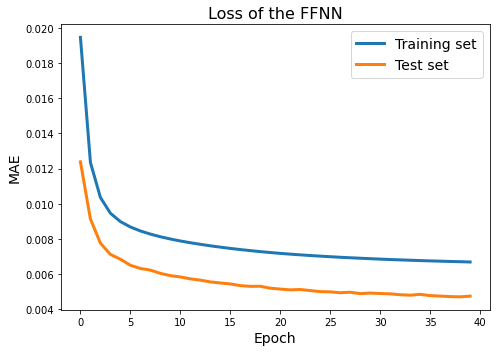

In [20]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['loss'], lw=3, label='Training set')
plt.plot(history.epoch, history.history['val_loss'], lw=3, label='Test set')
plt.legend(fontsize=14)
plt.title('Loss of the FFNN', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('MAE', fontsize=14)
plt.tight_layout()

## <font color=darkred> Recurrent Neural Networks</font>

At time $t$ the hidden state of the network is computed as follows:

$h_t = \sigma_h(W_x\,{x_t} + W_h\,{h_{t-1}} + b_h)$, where $\sigma_h$ is a nonlinear activation function, e.g. $\mathrm{tanh}$, $x_t$ is the input at time $t$ and $h_{t-1}$ is the hidden state at the previous time step.

$W_x$, $b_h$ and $W_h$ are the unknown parameters of the state update.

The predicted output is:

$\widehat{y}_t = \sigma_y(W_y\,{h_t} + b_y)\,,$

where $\sigma_y$ is the output activation function and $W_y$ and $b_y$ are the unknown parameters of the prediction step.

**Question**

Define a RNN model with one hidden layer ``SimpleRNN``

In [21]:
from keras.layers.recurrent import SimpleRNN
model_rnn = Sequential()
##
# TO DO: add the hidden layer of the rnn
## 
model_rnn.add(SimpleRNN(32, input_shape=input_shape))
model_rnn.add(Dense(1, activation='linear'))

model_rnn.compile(loss='mae', optimizer='adam')

model_rnn.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn (SimpleRNN)       (None, 32)                1280      
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 33        
Total params: 1,313
Trainable params: 1,313
Non-trainable params: 0
_________________________________________________________________


In [22]:
batch_size = 64
epochs = 50
history = model_rnn.fit(train_X, train_y, epochs = epochs, batch_size = batch_size, validation_data=(test_X, test_y), verbose=1)

Epoch 1/50
548/548 [==============================] - 1s 990us/step - loss: 0.0227 - val_loss: 0.0057
Epoch 2/50
548/548 [==============================] - 0s 846us/step - loss: 0.0080 - val_loss: 0.0048
Epoch 3/50
548/548 [==============================] - 0s 733us/step - loss: 0.0076 - val_loss: 0.0056
Epoch 4/50
548/548 [==============================] - 0s 801us/step - loss: 0.0076 - val_loss: 0.0050
Epoch 5/50
548/548 [==============================] - 0s 734us/step - loss: 0.0075 - val_loss: 0.0050
Epoch 6/50
548/548 [==============================] - 0s 680us/step - loss: 0.0075 - val_loss: 0.0052
Epoch 7/50
548/548 [==============================] - 0s 764us/step - loss: 0.0076 - val_loss: 0.0047
Epoch 8/50
548/548 [==============================] - 0s 730us/step - loss: 0.0074 - val_loss: 0.0057
Epoch 9/50
548/548 [==============================] - 0s 739us/step - loss: 0.0074 - val_loss: 0.0051
Epoch 10/50
548/548 [==============================] - 0s 769us/step - loss: 0.007

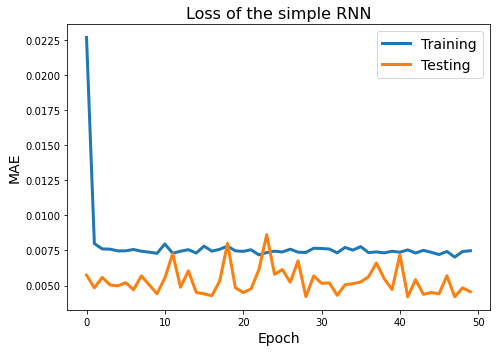

In [23]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['loss'], lw=3, label='Training')
plt.plot(history.epoch, history.history['val_loss'], lw=3, label='Testing')
plt.legend(fontsize=14)
plt.title('Loss of the simple RNN', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('MAE', fontsize=14)
plt.tight_layout()

## <font color=darkred> Long Short-Term memory </font>

The LSTM cell is a more complex recurrent neural network. It contains three gates, input, forget, output gates and a memory cell i.e. several hidden transformations to process the hidden state and the input. 

The first transforms at time $t$ are: 

$i_t = \sigma ( W_i [h_{t-1}, x_t] + b_i)$, $f_t = \sigma ( W_f [h_{t-1},x_t] + b_f)$, $o_t = \sigma ( W_o [h_{t-1},x_t] + b_o)$,

where $W_i, W_f, W_o$, $b_i$, $b_f$ and $b_o$ are the unknown parameters (applied to the concatenation of $h_{t-1}$ (hidden state vector) and $x_t$ (input vector)).

The previous hidden state $h_{t-1}$ and the current input $x_t$ are used to compute the a candidate $g_t$:

$g_t = \mathrm{tanh}( W_g [h_{t-1}, x_t] + b_g)\,.$

The cell memory $c_t$, is updated as:

$c_t = c_{t-1} \circ f_t + g_t \circ i_t\,,$

where $c_{t-1}$ is the previous memory, and $\circ$ refers to element-wise multiplication.

The output, $h_t$, is computed as

$h_t = \mathrm{tanh}(c_t) \circ o\,.$

The predicted output is:

$\widehat{y}_t = \sigma_y(W_y\,{h_t} + b_y)\,,$

where $\sigma_y$ is the output activation function and $W_y$ and $b_y$is the unknown parameter of the prediction step.

**Question**

Define a LSTM model with one hidden layer

In [24]:
model = Sequential()

model.add(LSTM(10, input_shape=input_shape))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 10)                720       
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 11        
Total params: 731
Trainable params: 731
Non-trainable params: 0
_________________________________________________________________


In [25]:
batch_size = 64
epochs = 50
history = model.fit(train_X, train_y, epochs = epochs, batch_size = batch_size, validation_data=(test_X, test_y), verbose=1)

Epoch 1/50
548/548 [==============================] - 1s 3ms/step - loss: 0.0089 - val_loss: 0.0045
Epoch 2/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0063 - val_loss: 0.0041
Epoch 3/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0062 - val_loss: 0.0040
Epoch 4/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0061 - val_loss: 0.0040
Epoch 5/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0061 - val_loss: 0.0041
Epoch 6/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0061 - val_loss: 0.0041
Epoch 7/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0061 - val_loss: 0.0042
Epoch 8/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0061 - val_loss: 0.0041
Epoch 9/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0061 - val_loss: 0.0039
Epoch 10/50
548/548 [==============================] - 1s 1ms/step - loss: 0.0061 - val_loss: 0.0039

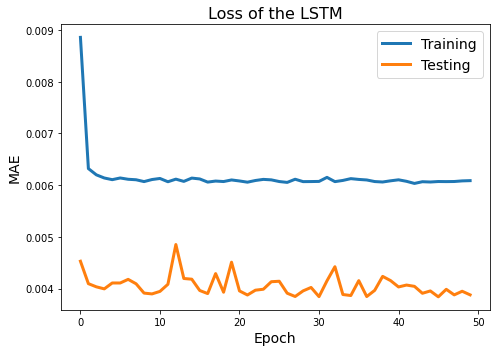

In [26]:
plt.figure(figsize=(7, 5))
plt.plot(history.epoch, history.history['loss'], lw=3, label='Training')
plt.plot(history.epoch, history.history['val_loss'], lw=3, label='Testing')
plt.legend(fontsize=14)
plt.title('Loss of the LSTM', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('MAE', fontsize=14)
plt.tight_layout()

**Questions**

Use a cross-validation to select the best LSTM and best RNN networks (with respect to the dimension of the hidden state) dimension.

Analyze the impact of the lag in the input sequence (i.e. if $x_t$ contains the features at times $t-1$, $t-2$, $t-3$) by using the function ``build_dataset`` with another parameter ``n_in``.

Analyze the sensitiviy of the LSTM with respect to initialization (by training several independent LSTM models).

Use the predict function to predict the observations $y$ associated with the input data in ``test_X``. Display these predictions with the true pollution level in ``y_test``. Compute the associated mean square error. 

In [27]:
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

def rnn_model(rnn_dim=32):
    model = Sequential()
    model.add(SimpleRNN(rnn_dim, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    
    return model

def lstm_model(lstm_dim=10):
    model = Sequential()
    model.add(LSTM(lstm_dim, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dense(1))
    model.compile(loss='mae', optimizer='adam')
    
    return model

In [28]:
rnn_estimator = KerasRegressor(build_fn=rnn_model, batch_size=64, epochs=30)
param_grid = {
    'rnn_dim': [4, 8, 16, 32, 64],
}
rnn_clf = GridSearchCV(estimator=rnn_estimator, param_grid=param_grid, n_jobs=-1, cv = 5, refit=False) 

for time_lag in range(3):
    processed_data = build_dataset(scaled, time_lag, 1)

    # split into train and test sets
    values = processed_data.values

    # number of years to use for training
    nb_years = 1
    n_train_hours = nb_years * 365 * 24

    train = values[:n_train_hours, :]
    test = values[n_train_hours:, :]

    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]

    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    
    print("===== Time lag : {} =====".format(time_lag))
    print()
    rnn_clf.fit(train_X, train_y)
    print("Best parameters set found on development set:")
    print()
    print(rnn_clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = rnn_clf.cv_results_['mean_test_score']
    stds = rnn_clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, rnn_clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

===== Time lag : 0 =====

Best parameters set found on development set:

{'rnn_dim': 4}

Grid scores on development set:

-0.009 (+/-0.012) for {'rnn_dim': 4}
-0.009 (+/-0.012) for {'rnn_dim': 8}
-0.009 (+/-0.012) for {'rnn_dim': 16}
-0.010 (+/-0.012) for {'rnn_dim': 32}
-0.009 (+/-0.012) for {'rnn_dim': 64}

===== Time lag : 1 =====

Best parameters set found on development set:

{'rnn_dim': 4}

Grid scores on development set:

-0.005 (+/-0.004) for {'rnn_dim': 4}
-0.005 (+/-0.003) for {'rnn_dim': 8}
-0.005 (+/-0.002) for {'rnn_dim': 16}
-0.006 (+/-0.002) for {'rnn_dim': 32}
-0.007 (+/-0.008) for {'rnn_dim': 64}

===== Time lag : 2 =====

Best parameters set found on development set:

{'rnn_dim': 32}

Grid scores on development set:

-0.007 (+/-0.002) for {'rnn_dim': 4}
-0.007 (+/-0.003) for {'rnn_dim': 8}
-0.006 (+/-0.002) for {'rnn_dim': 16}
-0.006 (+/-0.003) for {'rnn_dim': 32}
-0.007 (+/-0.005) for {'rnn_dim': 64}



In [29]:
lstm_estimator = KerasRegressor(build_fn=lstm_model, batch_size=64, epochs=20)
param_grid = {
    'lstm_dim': [4, 8, 16, 32, 64],
}
lstm_clf = GridSearchCV(estimator=lstm_estimator, param_grid=param_grid, n_jobs=-1, cv = 5, refit=False)

In [30]:
for time_lag in range(3):
    processed_data = build_dataset(scaled, time_lag, 1)

    # split into train and test sets
    values = processed_data.values

    # number of years to use for training
    nb_years = 1
    n_train_hours = nb_years * 365 * 24

    train = values[:n_train_hours, :]
    test = values[n_train_hours:, :]
    
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]

    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    
    print("===== Time lag : {} =====".format(time_lag))
    print()
    lstm_clf.fit(train_X, train_y)
    print("Best parameters set found on development set:")
    print()
    print(lstm_clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = lstm_clf.cv_results_['mean_test_score']
    stds = lstm_clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, lstm_clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))
    print()

===== Time lag : 0 =====

Best parameters set found on development set:

{'lstm_dim': 8}

Grid scores on development set:

-0.008 (+/-0.013) for {'lstm_dim': 4}
-0.008 (+/-0.013) for {'lstm_dim': 8}
-0.008 (+/-0.013) for {'lstm_dim': 16}
-0.008 (+/-0.014) for {'lstm_dim': 32}
-0.008 (+/-0.012) for {'lstm_dim': 64}

===== Time lag : 1 =====

Best parameters set found on development set:

{'lstm_dim': 16}

Grid scores on development set:

-0.006 (+/-0.008) for {'lstm_dim': 4}
-0.004 (+/-0.004) for {'lstm_dim': 8}
-0.003 (+/-0.004) for {'lstm_dim': 16}
-0.004 (+/-0.004) for {'lstm_dim': 32}
-0.004 (+/-0.004) for {'lstm_dim': 64}

===== Time lag : 2 =====

Best parameters set found on development set:

{'lstm_dim': 32}

Grid scores on development set:

-0.007 (+/-0.011) for {'lstm_dim': 4}
-0.004 (+/-0.004) for {'lstm_dim': 8}
-0.004 (+/-0.004) for {'lstm_dim': 16}
-0.003 (+/-0.004) for {'lstm_dim': 32}
-0.005 (+/-0.004) for {'lstm_dim': 64}



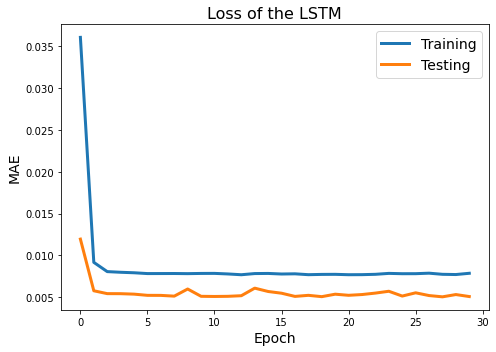

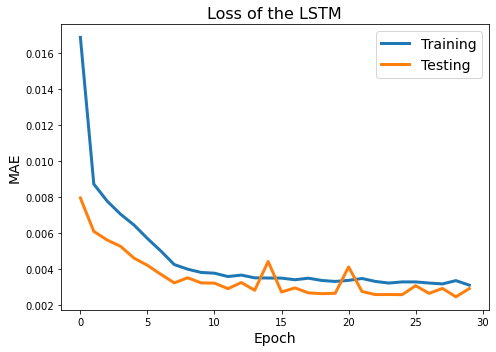

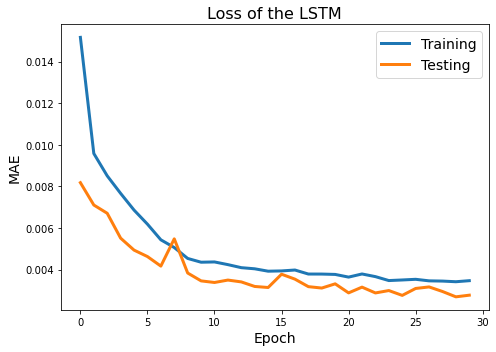

In [31]:
for time_lag in range(3):
    processed_data = build_dataset(scaled, time_lag, 1)

    # split into train and test sets
    values = processed_data.values

    # number of years to use for training
    nb_years = 1
    n_train_hours = nb_years * 365 * 24

    train = values[:n_train_hours, :]
    test = values[n_train_hours:, :]
    
    train_X, train_y = train[:, :-1], train[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]

    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
    model = lstm_model()
    history = model.fit(train_X, train_y, epochs=30, batch_size=64, validation_data=(test_X, test_y), verbose=0)
    plt.figure(figsize=(7, 5))
    plt.plot(history.epoch, history.history['loss'], lw=3, label='Training')
    plt.plot(history.epoch, history.history['val_loss'], lw=3, label='Testing')
    plt.legend(fontsize=14)
    plt.title('Loss of the LSTM', fontsize=16)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('MAE', fontsize=14)
    plt.tight_layout()

In [32]:
time_lag = 1
lstm_dim = 10

processed_data = build_dataset(scaled, time_lag, 1)

# split into train and test sets
values = processed_data.values

# number of years to use for training
nb_years = 1
n_train_hours = nb_years * 365 * 24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
model = lstm_model(lstm_dim)
model.fit(train_X, train_y, epochs=30, batch_size=64, validation_data=(test_X, test_y), verbose=1)

Epoch 1/30
137/137 [==============================] - 1s 8ms/step - loss: 0.0300 - val_loss: 0.0072
Epoch 2/30
137/137 [==============================] - 0s 3ms/step - loss: 0.0088 - val_loss: 0.0061
Epoch 3/30
137/137 [==============================] - 0s 3ms/step - loss: 0.0082 - val_loss: 0.0057
Epoch 4/30
137/137 [==============================] - 1s 4ms/step - loss: 0.0077 - val_loss: 0.0053
Epoch 5/30
137/137 [==============================] - 0s 3ms/step - loss: 0.0072 - val_loss: 0.0050
Epoch 6/30
137/137 [==============================] - 0s 3ms/step - loss: 0.0068 - val_loss: 0.0049
Epoch 7/30
137/137 [==============================] - 0s 3ms/step - loss: 0.0064 - val_loss: 0.0044
Epoch 8/30
137/137 [==============================] - 0s 3ms/step - loss: 0.0059 - val_loss: 0.0044
Epoch 9/30
137/137 [==============================] - 0s 3ms/step - loss: 0.0055 - val_loss: 0.0043
Epoch 10/30
137/137 [==============================] - 0s 3ms/step - loss: 0.0051 - val_loss: 0.0037